# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Finding Lane Lines on the Road** 
***
This project focused on lane finding from a dashboard mounted camera. First, an image analysis pipeline is developed using a series of individual images, and then applied a video stream to assess the performance of lane finding with an environment with curved road features.

The program flow is as follows:
* Perform camera calibration
* Perform distortion correction
* Perform top-down perspective transform
* Investigate color/gradient threshold transformations
* Extract lane line features from top-down image
* Calculate lane curvature through polynomial fit
* Overlay lane visualization on video frames and print out metrics

### Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
import glob
import pickle

%matplotlib inline

### Read in example image and verify shape

Image type: <class 'numpy.ndarray'>
Image shape: (720, 1280, 3)


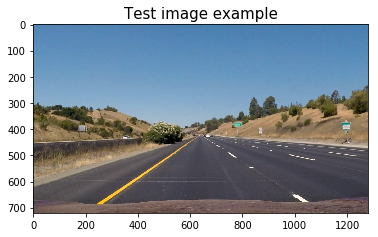

In [2]:
# Read in a test image

test_image = mpimg.imread('test_images/straight_lines1.jpg')

# Check image type, shape

print('Image type:', type(test_image))
print('Image shape:', test_image.shape)
plt.title('Test image example', fontsize=15)
plt.imshow(test_image)

### Define Useful Functions

In [3]:
# Define a function to plot images for comparision as needed to show the result of transformations

def plot_two_images(img1, img2, title_1, title_2, outname = None, save = None):
    
    # Plot images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))

    ax1.imshow(img1)
    ax1.set_title(title_1, fontsize=30)
    
    ax1.set_xlabel('x dimension', fontsize = 20)
    ax1.set_ylabel('y dimension', fontsize = 20)

    ax2.imshow(img2)
    ax2.set_title(title_2, fontsize=30)
    
    ax2.set_xlabel('x dimension', fontsize = 20)
    ax2.set_ylabel('y dimension', fontsize = 20)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save == True:
        plt.savefig('./output_images/' + outname + '.jpg')
    
    plt.show
    
    return

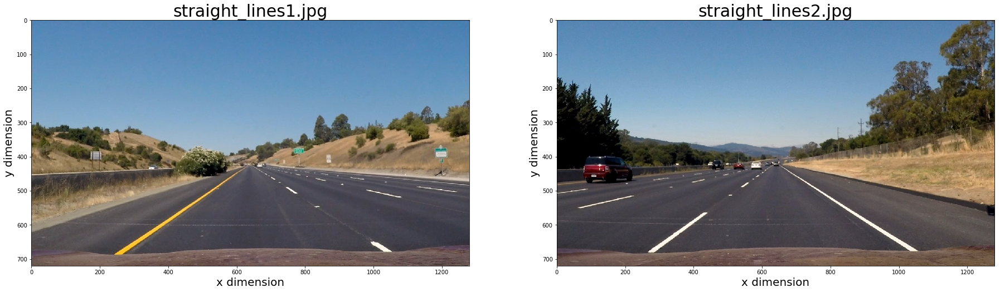

In [4]:
# Test image function

image_test1 = mpimg.imread('test_images/straight_lines1.jpg')
image_test2 = mpimg.imread('test_images/straight_lines2.jpg')

plot_two_images(image_test1, image_test2, title_1 = 'straight_lines1.jpg', title_2 = 'straight_lines2.jpg', outname = 'imageplottest', save = True)

### 1. Camera Calibration
***
ChessBoard calibration images are read in, then cv2 functions are used to identify the corners within the ChessBoard calibration images. The calibration information is then saved as a calibration file which can be used later when applying distortion correction.

In [5]:
# Define a set of object points
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Define arrays to store object (3D space) and image (2D space) points from imported images
objpoints = []
imgpoints = []

# print a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Iterate through the list, searching for chesseboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Use cv2 to find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        print('working on ', fname)
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw the found corners, save images to the output_images folder
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = 'corners_found' + str(idx) + '.jpg'
        cv2.imwrite('./output_images/chessboard_images/' + write_name, img)
        
# Load image for reference
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Perform camera calibration for the given object and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Save the calibration file
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("./camera_cal/calibration_pickle.p", "wb"))

working on  ./camera_cal\calibration10.jpg
working on  ./camera_cal\calibration11.jpg
working on  ./camera_cal\calibration12.jpg
working on  ./camera_cal\calibration13.jpg
working on  ./camera_cal\calibration14.jpg
working on  ./camera_cal\calibration15.jpg
working on  ./camera_cal\calibration16.jpg
working on  ./camera_cal\calibration17.jpg
working on  ./camera_cal\calibration18.jpg
working on  ./camera_cal\calibration19.jpg
working on  ./camera_cal\calibration2.jpg
working on  ./camera_cal\calibration20.jpg
working on  ./camera_cal\calibration3.jpg
working on  ./camera_cal\calibration6.jpg
working on  ./camera_cal\calibration7.jpg
working on  ./camera_cal\calibration8.jpg
working on  ./camera_cal\calibration9.jpg


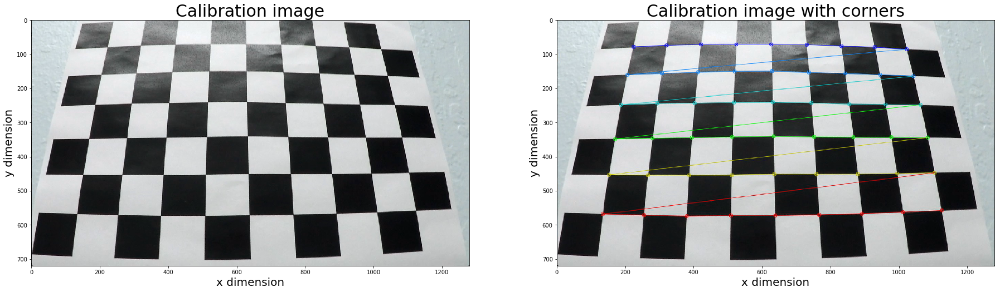

In [6]:
# Plot an example of the calibration image and after finding corners

cal_img_3 = cv2.imread('./camera_cal/calibration3.jpg')
foundlines_img_13 = cv2.imread('./output_images/chessboard_images/corners_found13.jpg')

plot_two_images(cal_img_3, foundlines_img_13,
                title_1 = 'Calibration image', title_2 = 'Calibration image with corners',
                outname = 'calibration_image_with_corners', save = True)

### Define Undistortion Function
The camera calibration file is used to undistort the images.

In [7]:
# Read in the saved camera matrix and distortion coefficients

dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in a test image
img = cv2.imread('./camera_cal/calibration3.jpg')

# Define chessboard size parameters, nx (number of inside corners in x) and ny (number of inside corners in y)

nx = 9
ny = 6

def corners_unwarp(img, nx, ny, mtx, dist):
    
    # Undistort using mtx and dist
    img_size = (img.shape[1], img.shape[0])
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    # Darw corners if corners are found
    if ret == True:
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        # Define 4 source points src = np.float32([[,],[,],[,],[,]])
        # Detected corners found using the automatic corner detection
        offset = 100
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
            
        # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        dst = np.float32([[offset, offset],[img_size[0]-offset, offset],[img_size[0]-offset, img_size[1]-offset],[offset, img_size[1]-offset]])
            
        # Use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
            
        # Use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(undist, M, img_size)
    
    return warped, M

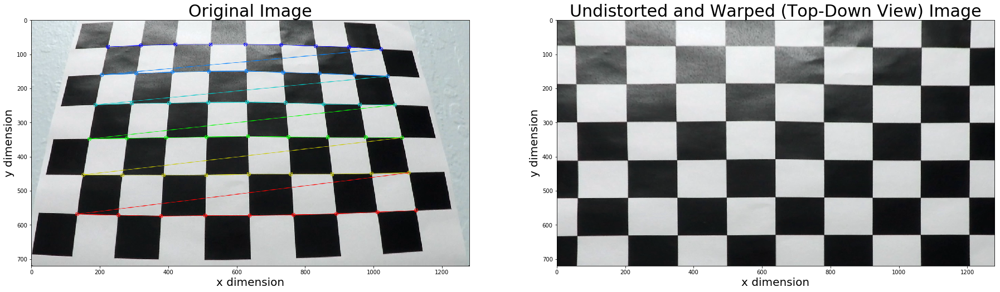

In [8]:
# Test the undistort and top-down transformation on a calibration image

top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)

plot_two_images(img, top_down,
                title_1 = 'Original Image', title_2 = 'Undistorted and Warped (Top-Down View) Image',
                outname = 'undistort_chessboard', save = True)

In [9]:
# Define a stand-alone function to perform the camera distortion correction

def undistort(image):
    
    dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    
    return undistorted

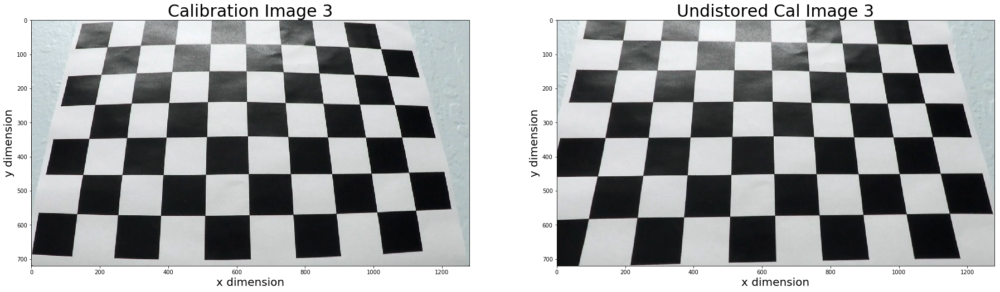

In [10]:
# Plot an example of a raw and undistored image

cal_img3 = cv2.imread('./camera_cal/calibration3.jpg')

cal_img3_undist = undistort(cal_img3)

plot_two_images(cal_img3, cal_img3_undist,
                title_1 = 'Calibration Image 3', title_2 = 'Undistored Cal Image 3',
                outname = 'cal_image_undistorted', save = True)

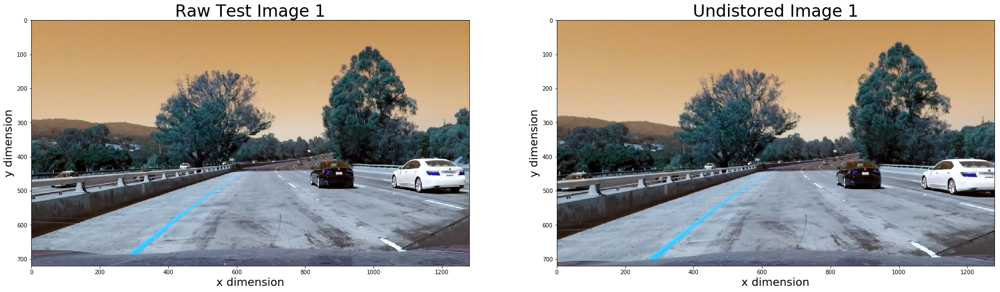

In [11]:
# Plot an example of a raw and undistored image

img_test1 = cv2.imread('./test_images/test1.jpg')

img_test1_undist = undistort(img_test1)

plot_two_images(img_test1, img_test1_undist,
                title_1 = 'Raw Test Image 1', title_2 = 'Undistored Image 1',
                outname = 'test_image_undistorted', save = True)

In [12]:
# Define a stand-alone function to perform the top-down perspective warp

def perspective_transform(image):

    img_size = (image.shape[1], image.shape[0])

    preprocessImage = np.zeros_like(img[:,:,0])

    bot_width = 0.74 # percent of bottom trapizoid height
    mid_width = 0.08 # percent of middle trapizoid height
    height_pct = 0.61 # percent for trapizoid width
    bottom_trim = 0.95 # percent from top to bottom to avoid car hood

    src = np.float32([[img.shape[1] * (0.5 - mid_width / 2), img.shape[0] * height_pct],
                      [img.shape[1] * (0.5 + mid_width / 2), img.shape[0] * height_pct],
                      [img.shape[1] * (0.5 + bot_width / 2), img.shape[0] * bottom_trim],
                      [img.shape[1] * (0.5 - bot_width / 2), img.shape[0] * bottom_trim]])

    offset = img_size[0] * 0.25

    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    
    # Define topdown perspective transform

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(image, M, img_size, flags = cv2.INTER_LINEAR)
    
    print("src array: ", src)
    print("dst array: ", dst)

    return warped


src array:  [[  588.79998779   439.20001221]
 [  691.20001221   439.20001221]
 [ 1113.59997559   684.        ]
 [  166.3999939    684.        ]]
dst array:  [[ 320.    0.]
 [ 960.    0.]
 [ 960.  720.]
 [ 320.  720.]]


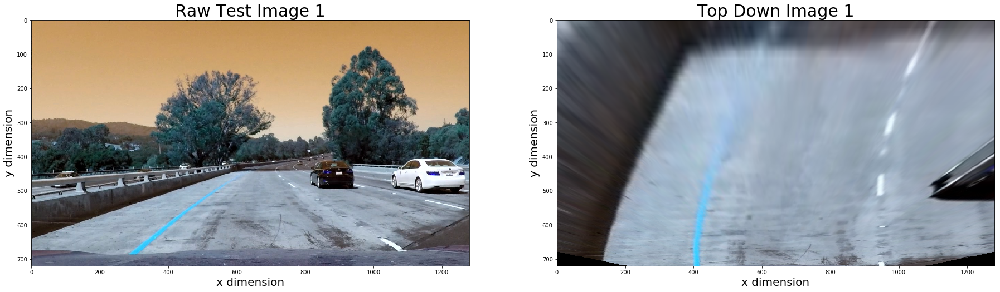

In [13]:
# Plot an example of a raw and undistored image

img_test1 = cv2.imread('./test_images/test1.jpg')

img_test1_undist = undistort(img_test1)
img_topdown = perspective_transform(img_test1_undist)

plot_two_images(img_test1, img_topdown,
                title_1 = 'Raw Test Image 1', title_2 = 'Top Down Image 1',
                outname = 'test_image_topdown', save = True)

In [14]:
# Hard code src and dst coordinates

src = np.float32([[588.8, 439.2],
                [691.2, 439.2],
                [1113.6, 684],
                [166.4, 684]])    

dst = np.float32([[320, 0],
                [960, 0],
                [960, 720],
                [320, 720]])

In [15]:
def topdown(image):
    
    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    
    return warped


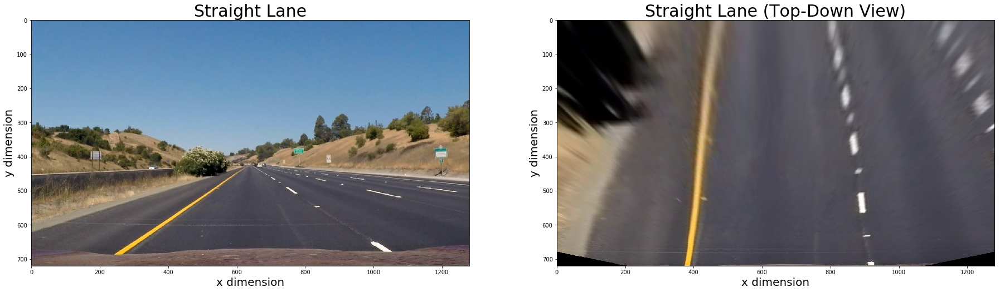

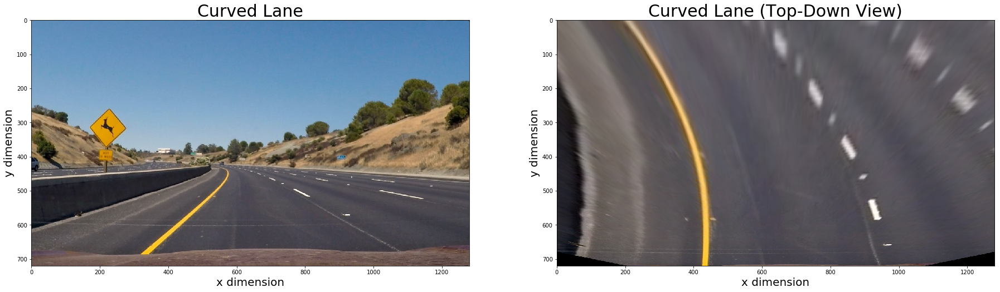

In [16]:
# Test the perspective transform on different lane types: straight vs. curved
# Print out example images of straight vs curved lanes

straight_lane_test = mpimg.imread('test_images/straight_lines1.jpg')
curved_lane_test = mpimg.imread('test_images/test2.jpg')

warp_test_straight = topdown(straight_lane_test)
warp_test_curved = topdown(curved_lane_test)

plot_two_images(straight_lane_test, warp_test_straight,
                title_1 = 'Straight Lane', title_2 = 'Straight Lane (Top-Down View)',
                outname = 'straight_lane_warp_test', save = True)

plot_two_images(curved_lane_test, warp_test_curved,
                title_1 = 'Curved Lane', title_2 = 'Curved Lane (Top-Down View)',
                outname = 'curved_lane_warp_test', save = True)

In [17]:
# Define a stand-alone unwarping function

def unwarp(image):
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    newwarp = cv2.warpPerspective(image, Minv, (1280, 720))
    
    return newwarp

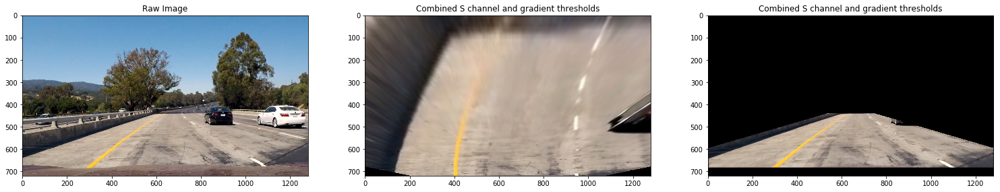

In [18]:
# Test the warping and unwarping of an image

img_test1 = mpimg.imread('test_images/test1.jpg')
undist1 = undistort(img_test1)
warped1 = topdown(undist1)
unwarped1 = unwarp(warped1)

# Plotting thresholded images
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))

ax1.set_title('Raw Image')
ax1.imshow(img_test1)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped1, cmap='gray')

ax3.set_title('Combined S channel and gradient thresholds')
ax3.imshow(unwarped1, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'warp_unwarp_example' + '.jpg')

In [19]:
# Run the topdown transform on all test images

images = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = undistort(img)
    img = topdown(img)
    
    result = img
    
    write_name = './transformation_test/trans_test' + str(idx) + '.jpg'
    cv2.imwrite(write_name, result)

### Sobel Functions
***
Define the Sobel threshold transformation function.

In [20]:
# Define the Absolute Sobel Threshold Function that applies Sobel x or y, and then takes an absolute value and applies a threshold.

def abs_sobel_thresh(img, orient='x', sobel_kernel = 5, thresh = (0, 255)):
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    # Take the absolute value of the derivative or gradient
    if orient == 'x':
        abs_sobel = np.absolute(sobelx)
    if orient == 'y':
        abs_sobel = np.absolute(sobely)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

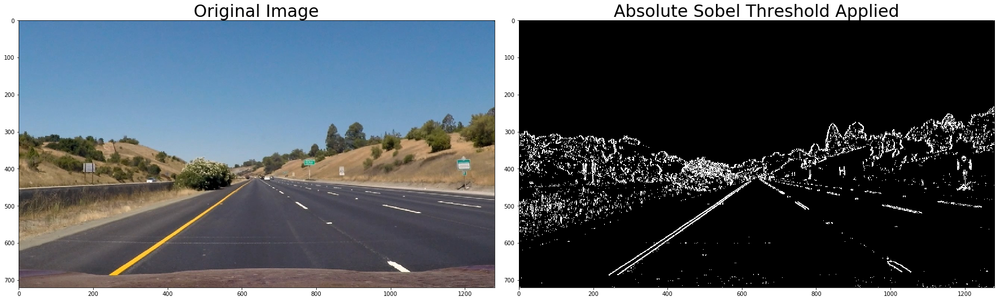

In [21]:
# Test the abs_sobel_thresh function
# Read in a test image and grayscale it
image_test = mpimg.imread('test_images/straight_lines1.jpg')
    
# Run the function to test
grad_binary = abs_sobel_thresh(image_test, orient='x', thresh = (20, 250))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Absolute Sobel Threshold Applied', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'abs_soble_thresh_test' + '.jpg')

In [22]:
# Define and test the Magnitude Sobel Threshold Function.

def mag_thresh(image, sobel_kernel = 3, mag_thresh = (0, 255)):
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag / scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag < mag_thresh[1])] = 1
    
    return binary_output

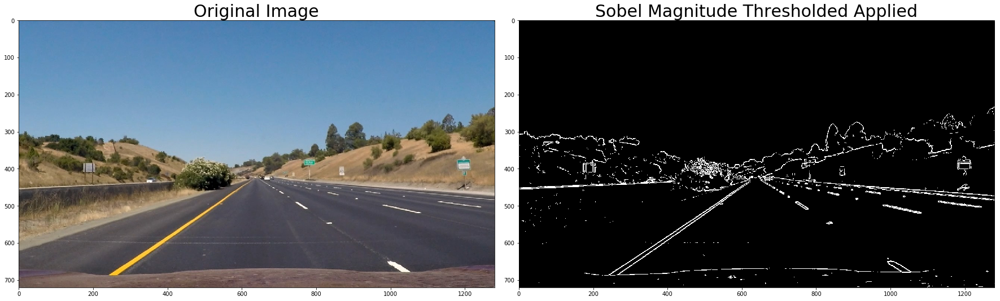

In [23]:
# Test the mag_thresh function on test_image    

mag_thresh_test = mag_thresh(image_test, sobel_kernel = 3, mag_thresh = (50, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(mag_thresh_test, cmap='gray')
ax2.set_title('Sobel Magnitude Thresholded Applied', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'mag_thresh_test' + '.jpg')

### Color Filtering and Transformations
***
First, the ChessBoard calibration images are read into a function and cv2 functions are used to identify the corners within the ChessBoard calibration images. The calibration information is then saved as a calibration file which can be used later when applying distortion correction.

In [24]:
# Define HLS Color Threshold Function that thresholds the S-channel of HLS and test it.

def hls_select(img, thresh=(0, 255)):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output

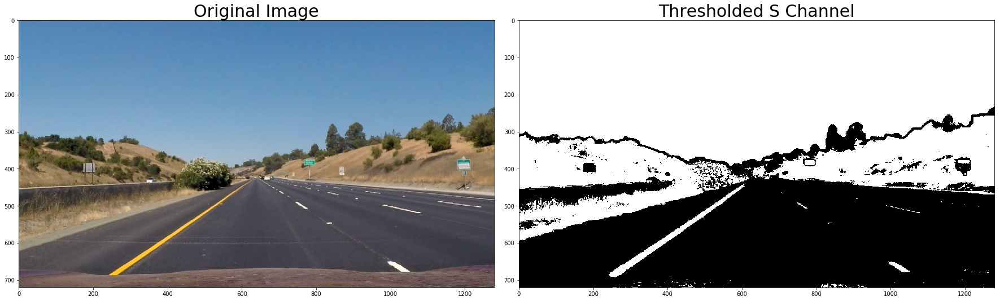

In [25]:
# Test the hls_select function

hls_binary = hls_select(image_test, thresh=(50, 255))

# Read in a test image
#image = mpimg.imread('test_images/straight_lines1.jpg') 

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(hls_binary, cmap='gray')

ax2.set_title('Thresholded S Channel', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'hls_binary_test' + '.jpg')

In [26]:
# Define a color threshold function with HLS and HSV and test it.

def color_threshold(image, sthresh = (0,255), vthresh=(0,255)):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1
    
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1
    
    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    
    return output

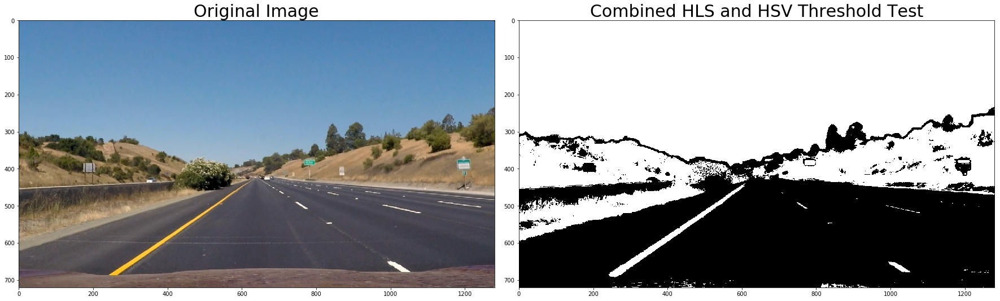

In [27]:
# Test the color_threshold function

# Read in a test image
#image_test = mpimg.imread('test_images/straight_lines1.jpg')

thresh_test = color_threshold(image_test, sthresh = (50,255), vthresh = (50,255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(thresh_test, cmap='gray')
ax2.set_title('Combined HLS and HSV Threshold Test', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'color_thresh_test' + '.jpg')

### Binary Image for Pipeline Funciton
Define the final pipeline for producing the binary output image.

In [28]:
def pipeline_color(img, s_thresh=(170, 255), sx_thresh=(20, 100), sobel_kernel=9):
    
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    #sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    sxbinary = np.zeros_like(scaled_sobel)
    #sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

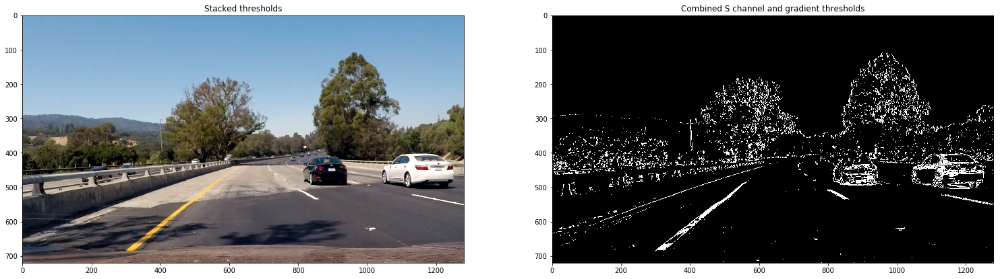

In [29]:
img_test = mpimg.imread('test_images/test4.jpg')    
result = pipeline_color(img_test, s_thresh=(200, 255), sx_thresh=(30, 100), sobel_kernel=1)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(result, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'color_pipeline' + '.jpg')

In [49]:
s_thresh = (115, 200)
sx_thresh = (20, 150)

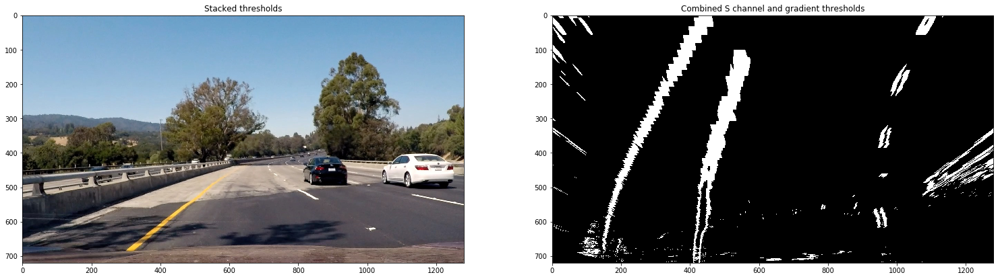

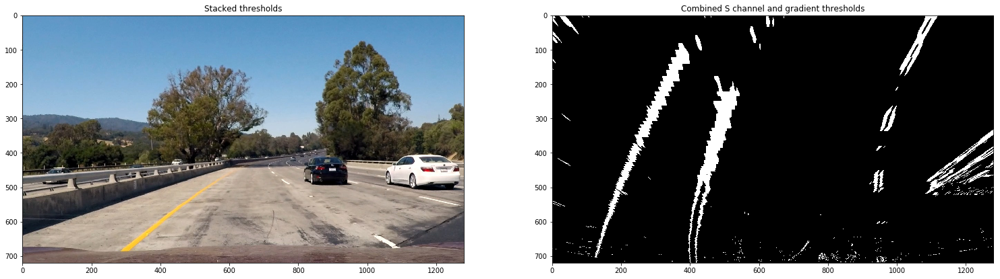

In [50]:
# Test the creation of binary_warped image including top-down transformation

img_test4 = mpimg.imread('test_images/test4.jpg')
result4 = pipeline_color(img_test4, s_thresh=s_thresh, sx_thresh=sx_thresh, sobel_kernel=10)
warped4 = topdown(result4)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test4)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped4, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'binary_warped_example' + '.jpg')

# Test the creation of binary_warped image including top-down transformation

img_test1 = mpimg.imread('test_images/test1.jpg')
result1 = pipeline_color(img_test1, s_thresh=s_thresh, sx_thresh=sx_thresh, sobel_kernel=10)
warped1 = topdown(result1)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test1)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped1, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'transform_pipeline_test' + '.jpg')

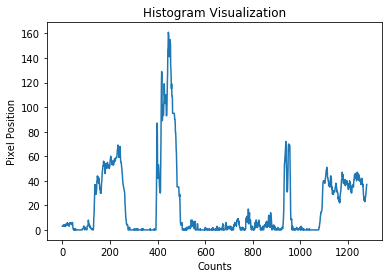

In [51]:
#### Investigate the creation of a histogram of a binary_warped image

img_test1 = mpimg.imread('test_images/test1.jpg')
undist1 = undistort(img_test1)
binary_warped1 = pipeline_color(undist1, s_thresh=s_thresh, sx_thresh=sx_thresh, sobel_kernel=1)
warped_hist = topdown(binary_warped1)

def histogram_vis(image):
    
    histogram = np.sum(image[int(image.shape[0]//2):,:], axis=0)
    
    plt.title('Histogram Visualization')
    plt.xlabel('Counts')
    plt.ylabel('Pixel Position')
    plt.plot(histogram)
    plt.savefig('./output_images/histogram_visualization.jpg')
    
    return

histogram_vis(warped_hist)


### Lane Finding Sandbox
Experiment with lane finding approach using historgram and sliding window.

In [52]:
# Finding window approach seen in the course materials

def sandbox(binary_warped):

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    window_img = np.zeros_like(out_img)

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100

    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped1.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped1.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0,255,0), 2) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))

        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))

    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))

    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    return result, left_fitx, right_fitx, ploty


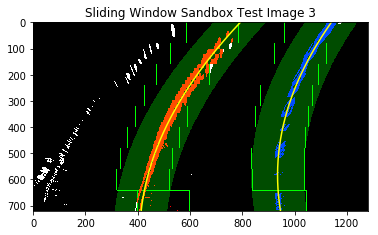

In [53]:
sandbox_img1 = mpimg.imread('test_images/test3.jpg')
undist1 = undistort(sandbox_img1)
binary_warped1 = topdown(pipeline_color(undist1, s_thresh=s_thresh, sx_thresh=sx_thresh, sobel_kernel=9))
result, left_fitx, right_fitx, ploty = sandbox(binary_warped1)

plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.title('Sliding Window Sandbox Test Image 3')
plt.xlim(0, 1280)
plt.ylim(720, 0)

plt.savefig('./output_images/' + 'sliding_window_test_3' + '.jpg')

### Define Lane Finding

In [54]:
# Sliding window approach to lane finding

def sliding_windows(binary_warped):
    
    # Input is binary_warped image,
    # highest proportaion of white vs black will be the lane lines
    # a histogram is produced for the bottom part of the image to find line sections
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255
    
    # Find peak historgram levels of the left and right sides of the histogram data
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Define the number of sliding windows to search with
    nwindows = 9
    
    # Define sliding window height
    window_height = np.int(binary_warped.shape[0] / nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices to the left and right lane lists
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit,left_res,_,_,_ = np.polyfit(lefty, leftx, 2, full=True)
    right_fit,right_res,_,_,_ = np.polyfit(righty, rightx, 2, full=True)
    
    ####################################################
    ### Visualization
    ####################################################
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0] )
    
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    out_img[ploty.astype('int'),left_fitx.astype('int')] = [0, 255, 255]
    out_img[ploty.astype('int'),right_fitx.astype('int')] = [0, 255, 255]
    
    y_eval = binary_warped.shape[0]
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2 * left_fit_cr[0])
    right_curverad = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2 * right_fit_cr[0])
    
    return left_fit, right_fit, np.sqrt(left_fit[1]/len(leftx)), np.sqrt(right_fit[1]/len(rightx)), left_curverad, right_curverad, out_img

In [55]:
# Define function to draw graphic overlays on the inverted image

def draw_lane(undistorted, binary_warped, l_fit, r_fit, l_rad, r_rad):
    
    # Image to draw lanes on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])

    l_fitx = l_fit[0] * ploty**2 + l_fit[1] * ploty + l_fit[2]
    r_fitx = r_fit[0] * ploty**2 + r_fit[1] * ploty + r_fit[2]
    
    # Recast X and Y points into a usable formate
    pts_left = np.array([np.transpose(np.vstack([l_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([r_fitx, ploty])))])
    
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    Minv = cv2.getPerspectiveTransform(dst, src)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]))
   
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    
    # Annotate image with lane curvature estimates
    cv2.putText(result, "Left Lane Radius: %.2f km" % (l_rad / 1000), (50,50), cv2.FONT_HERSHEY_DUPLEX, 1, (255,255,255), 2)
    cv2.putText(result, "Right Lane Radius: %.2f km" % (r_rad / 1000), (50,80), cv2.FONT_HERSHEY_DUPLEX, 1, (255,255,255), 2)
    
    # Annotate image with position estimate
    cv2.putText(result, "Vehicle Position: %.2f m" % ((np.average((l_fitx + r_fitx) / 2) - binary_warped.shape[1]//2) * 3.7 / 700), (50,110), cv2.FONT_HERSHEY_DUPLEX, 1, (255,255,255), 2)
    
    return result

In [56]:
# Processing pipeline using list definitions and appending data to lists inspired from
# https://github.com/dventimi/CarND-Advanced-Lane-Lines/blob/master/lanelines.py

from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque
import cProfile

def get_processor(nbins=10):
    
    bins = nbins
    
    l_params = deque(maxlen = bins)
    r_params = deque(maxlen = bins)
    l_radius = deque(maxlen = bins)
    r_radius = deque(maxlen = bins)
    weights = np.arange(1, bins + 1) / bins
    
    def process_image(img):
        
        dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
        mtx = dist_pickle["mtx"]
        dist = dist_pickle["dist"]
        
        #undistorted = cv2.undistort(img0, mtx, dist, None, mtx)
        undistorted = undistort(img)
        
        # s_thresh=(120, 255), sx_thresh=(30, 100)
        #binary_warped = pipeline_topdown(abs_sobel_thresh(undistorted, orient='x', thresh = (20, 250)))
        #binary_warped = pipeline_topdown(color_threshold(undistorted, sthresh = (0,255), vthresh=(0,255)))
        #binary_warped = pipeline_topdown(mag_thresh(image, sobel_kernel = 3, mag_thresh = (0, 255)))        
        
        #undistorted = undistort(img0)
        binary_warped = topdown(pipeline_color(undistorted, s_thresh=s_thresh, sx_thresh=sx_thresh, sobel_kernel=9))
        #binary_warped = topdown(thresholdImage(undistorted))
        
        
        #l_fit, r_fit, l_res, r_res, l_curverad, r_curverad, _ = sliding_windows(binary_warped)
        #_, _, offset_right_from_center_m = detect_lines(binary_warped, l_fit, left_fitx, r_fit, right_fitx, l_lane_inds, r_lane_inds)
        l_fit, r_fit, l_res, r_res, l_curverad, r_curverad, _ = sliding_windows(binary_warped) #if len(l_params) == 0 else detect_lines(binary_warped,np.average(l_params,0,weights[-len(l_params):]), np.average(r_params,0,weights[-len(l_params):]))

        l_params.append(l_fit)
        r_params.append(r_fit)
        l_radius.append(l_curverad)
        r_radius.append(r_curverad)
                
        annotated_image = draw_lane(undistorted,
                                    binary_warped,
                                    np.average(l_params, 0, weights[-len(l_params):]),
                                    np.average(r_params, 0, weights[-len(l_params):]),
                                    np.average(l_radius, 0, weights[-len(l_params):]),
                                    np.average(r_radius, 0, weights[-len(l_params):]))
        return annotated_image
    return process_image

# #+RESULTS:

in_clip = VideoFileClip("project_video.mp4")
out_clip = in_clip.fl_image(get_processor(10))
cProfile.run('out_clip.write_videofile("output_video/project_output_test_pipeline_color.mp4", audio=False)', 'restats')

[MoviePy] >>>> Building video output_video/project_output_test_pipeline_color.mp4
[MoviePy] Writing video output_video/project_output_test_pipeline_color.mp4



  5%|████▎                                                                           | 67/1261 [00:08<02:29,  7.98it/s]


 11%|████████▍                                                                      | 135/1261 [00:18<02:31,  7.44it/s]


 16%|████████████▋                                                                  | 203/1261 [00:27<02:21,  7.49it/s]


 21%|████████████████▉                                                              | 271/1261 [00:35<02:11,  7.54it/s]


 27%|█████████████████████▏                                                         | 339/1261 [00:44<02:02,  7.53it/s]


 32%|█████████████████████████▍                                                     | 407/1261 [00:54<01:53,  7.53it/s]


 38%|█████████████████████████████▊                                                 | 475/1261 [01:02<01:43,  7.56it/s]


 43%|██████████████████████████████████                                             | 543/1261 [01:11<01:34,  7.61it/s]


 48%|██████████████████████████████████████▎                                        | 611/1261 [01:20<01:25,  7.62it/s]


 54%|██████████████████████████████████████████▌                                    | 679/1261 [01:28<01:16,  7.63it/s]


 59%|██████████████████████████████████████████████▊                                | 747/1261 [01:37<01:07,  7.63it/s]


 65%|███████████████████████████████████████████████████                            | 815/1261 [01:47<00:59,  7.55it/s]


 70%|███████████████████████████████████████████████████████▎                       | 883/1261 [01:56<00:49,  7.58it/s]


 75%|███████████████████████████████████████████████████████████▌                   | 951/1261 [02:05<00:40,  7.57it/s]


 81%|███████████████████████████████████████████████████████████████               | 1019/1261 [02:15<00:32,  7.52it/s]


 86%|███████████████████████████████████████████████████████████████████▏          | 1087/1261 [02:24<00:23,  7.52it/s]


 92%|███████████████████████████████████████████████████████████████████████▍      | 1155/1261 [02:33<00:14,  7.50it/s]


 97%|███████████████████████████████████████████████████████████████████████████▋  | 1223/1261 [02:43<00:05,  7.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:48<00:00,  7.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video/project_output_test_pipeline_color.mp4 

